In [1]:
figure_main_dir = r'/root/autodl-tmp/generated_img/anime_face'

In [2]:
import os
import random
from PIL import Image

dir_list = []
for item in os.listdir(figure_main_dir):
    dir_list.append(os.path.join(figure_main_dir, item))
dir_list = sorted(dir_list, key=lambda x: int(x.split('/')[-1]))

image_list = []
for current_dir in dir_list:
    for _ in range(7):
        image = Image.open(os.path.join(current_dir, f'{random.randint(0, 127)}.png'))
        image_list.append(image)


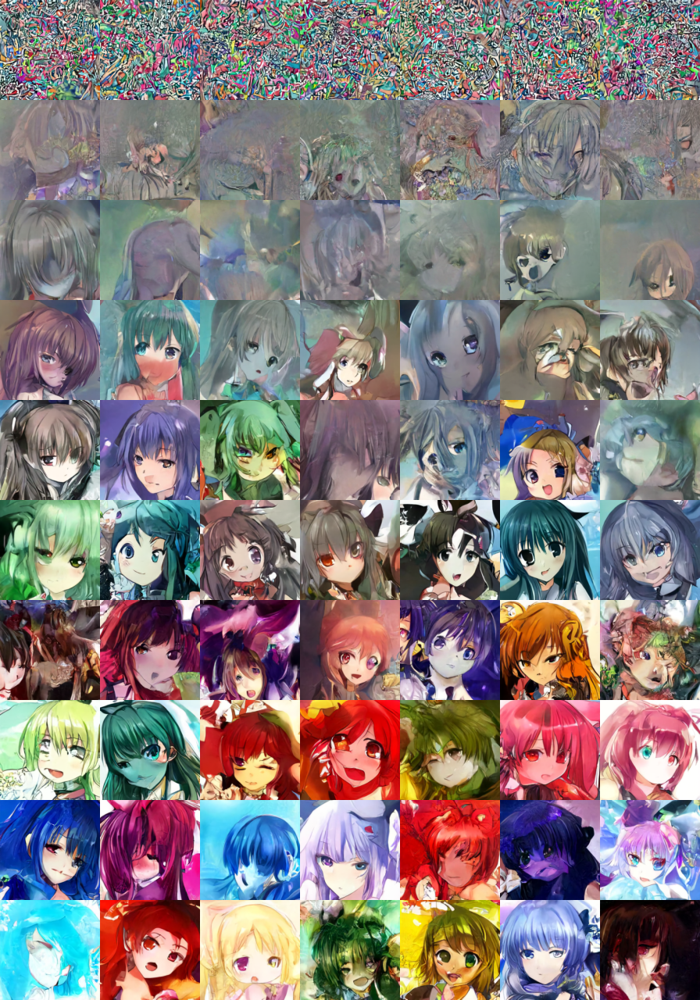

In [3]:
from PIL import Image

def concat_images(image_list, rows, cols):
    """
    Concatenates images in the given image list into a grid with the specified number of rows and columns.
    
    Args:
    - image_list (list): List of PIL.Image objects.
    - rows (int): Number of rows in the resulting grid.
    - cols (int): Number of columns in the resulting grid.
    
    Returns:
    PIL.Image object representing the concatenated images.
    """
    
    # Ensure that the number of images matches the grid dimensions
    if len(image_list) != rows * cols:
        raise ValueError(f"Number of images ({len(image_list)}) does not match grid dimensions ({rows}x{cols}).")

    # 获取每张图片的大小
    img_width, img_height = image_list[0].size

    # 创建一个新的空白图片来容纳所有的小图片
    total_width = img_width * cols
    total_height = img_height * rows

    new_image = Image.new('RGB', (total_width, total_height))

    # 使用两个嵌套循环将每张图片粘贴到正确的位置
    for row in range(rows):
        for col in range(cols):
            x_offset = col * img_width
            y_offset = row * img_height
            new_image.paste(image_list[row * cols + col], (x_offset, y_offset))
    
    return new_image

concat_images(image_list[:70], 10, 7)

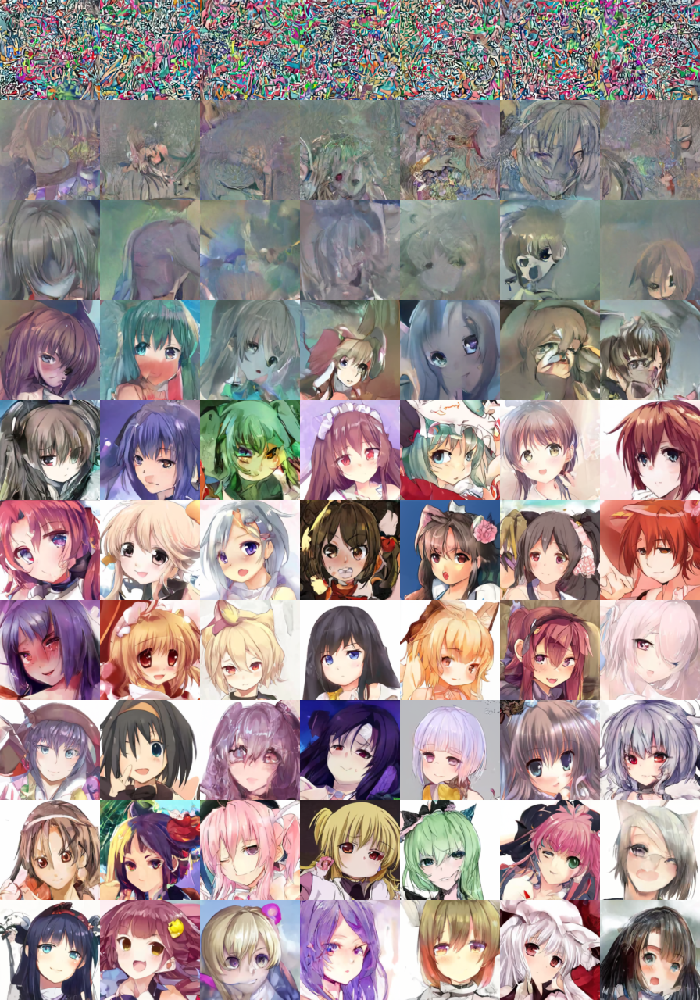

In [4]:
len(image_list)
import os

tmp_list = []
new_img_dir = '/root/autodl-tmp/generated_img/anime_face_all/1000'
for i in range(112):
    tmp_list.append(Image.open(os.path.join(new_img_dir, f'{i}.png')))

tmp = image_list[:31]
tmp.extend(tmp_list)
concat_images(tmp[:70], 10, 7)


# add noise to image

In [2]:
from PIL import Image
import os

img_dir = '/root/lancaster_dissertation_code/dissertation/figures/background/variational_diffusion_model'
file_name = 'example.jpeg'

image = Image.open(os.path.join(img_dir, file_name))
# image = image.resize((200, 300))
sample_image = image.convert("RGB")
# sample_image
sample_image.save(os.path.join(img_dir, '0.png'))

In [3]:
from torchvision import transforms

preprocess = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

sample_image = preprocess(sample_image).unsqueeze(0)

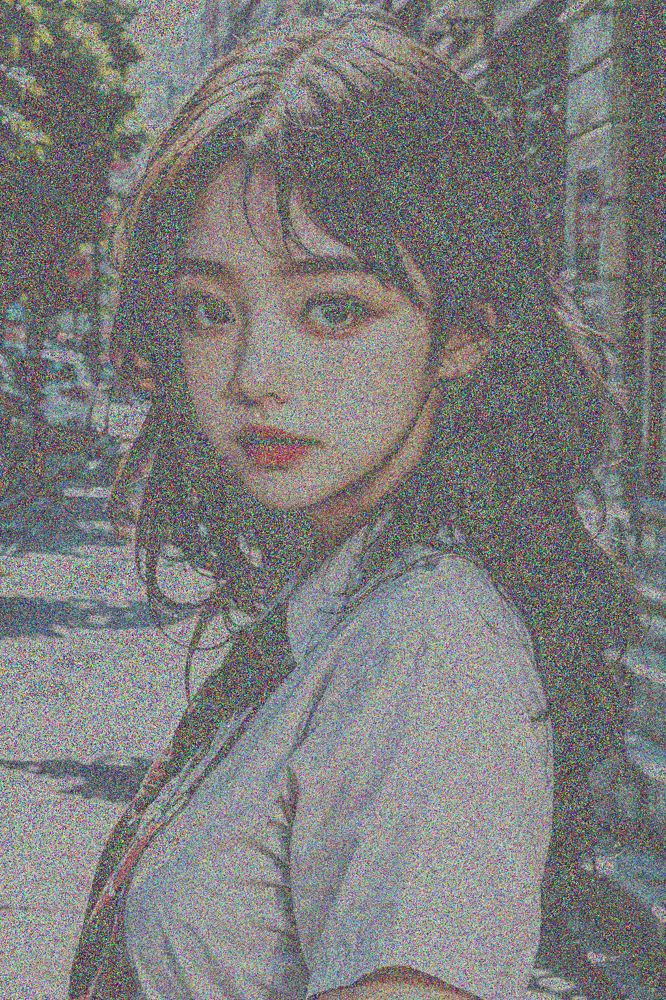

In [7]:
import torch
from PIL import Image
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=300)
noise = torch.randn(sample_image.shape)

step = 80

timesteps = torch.LongTensor([step])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

image = Image.fromarray(
    ((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0]
)

image.save(os.path.join(img_dir, f'{step}.png'))
image

# Dataset Example

In [3]:
from datasets import load_from_disk

dataset = load_from_disk(r'/root/autodl-tmp/dataset/smithsonian_butterfly')
dataset = dataset['train']

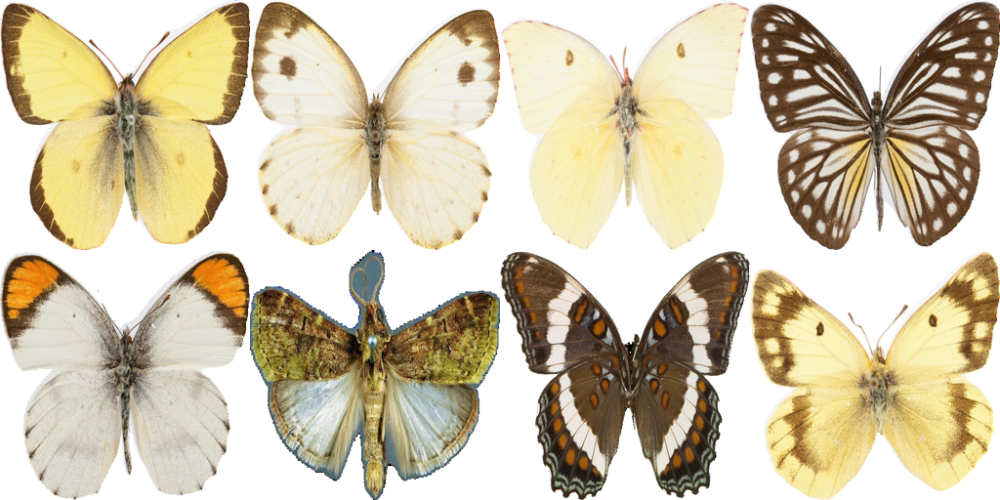

In [4]:
from PIL import Image
from datasets import load_dataset

import random

index_list = [random.randint(0, 999) for _ in range(8)]

def concatenate_images_from_dataset(dataset):
    """
    从数据集拼接八张图片为2x4格式

    :param dataset: HuggingFace的数据集对象
    :param output_path: 输出图片的路径
    :return: None
    """

    # 获取前8个图像并调整大小
    images = [dataset[i]['image'].resize((256, 256)) for i in index_list]

    # 确定输出图片的尺寸
    total_width = 256 * 4  # 因为有4列，每张图像宽度为128
    total_height = 256 * 2 # 因为有2行，每张图像高度为128

    # 创建一个空白图片用于粘贴
    concatenated_img = Image.new('RGB', (total_width, total_height))

    # 第一行
    for i in range(4):
        concatenated_img.paste(images[i], (i * 256, 0))

    # 第二行
    for i in range(4, 8):
        concatenated_img.paste(images[i], ((i-4) * 256, 256))

    return concatenated_img


concatenate_images_from_dataset(dataset)
